Author: Prabin

## Image Representation:

A digital image is represented as a grid of pixels, where each pixel corresponds to a specific location in the image and has a numerical value representing its intensity or color. This grid is created by sampling the continuous image at discrete intervals and quantizing the intensity levels of each pixel.

Sampling a "continuous image" means converting the continuous variations of the image into discrete values by measuring the intensity levels at regular intervals (pixels) across the image.

<center>
<img src="https://drive.google.com/uc?export=view&id=1amhadwWOYRIQGYCinZFmYq8xN8_g-70-" width=800/>

Figure 1: Digital Image Formation Process
</center>


Mathematically, an image can be defined as a two-dimensional function, $f(x, y)$ where $x$ and $y$ are the coordinates inside the image, and $f$ at location $(x,y)$ gives the intensity or gray level of the image at the particular point.
Here, $x$ is the row number and $y$ is the column number.

<center>
<img src="https://drive.google.com/uc?export=view&id=1BW635f8iUECKM_PcF51wfxqDf9pSmF1U" width=800/>

Figure 2: Image representation using spatial function $f(x, y)$
</center>

Say we quantize a continuous image into a discrete image with $M$ rows and $N$ columns. Then the discrete image $f(x, y)$ can be represented as a $M \times N$ matrix defined as follows:

$$f(x, y) =
\begin{bmatrix}
f(0, 0) & f(0, 1) & \cdots & f(0, N-1) \\
f(1, 0) & f(1, 1) & \cdots & f(1, N-1) \\
\vdots & \vdots &  & \vdots \\
f(M - 1, 0) & f(M - 1, 1) & \cdots & f(M - 1, N-1)
\end{bmatrix}$$


\

The images can be represented as :
1. Binary: 0 for black , 1 for white
2. Grayscale: 1 channel only with 0 to 255 values (for 8 bit representation which has 256 different possible numbers)
3. Colored: 3 standard RGB channels (or more). Each channel having respective (0-255) values are stacked in the 3rd dimension, giving the viewers an illusion of seeing an colored 2d image. This allows to represent $256 \times 256 \times 256 = 16,777,216 $ different colors. And, we define a color with a vector of length 3. For example, $(231, 30, 114)$ color gives levels for each red, green, and blue color

The difference is summarized in thee figure:

<center>
<img src="https://drive.google.com/uc?export=view&id=1_8jA_Cv65_hHvAiJV2RixanC_l_pO0X7" width=700/>

Table 1: Image Representation using matrix and tensor
</center>



## OpenCV for Image Processing:

1.   List item
2.   List item



OpenCV-Python is a Python wrapper for the original OpenCV C++ implementation. Since OpenCV is both fast (C++ implementation) and easy to use (Python wrapper) it has been widely used to solve computer vision problems.

Lets learn three operations:
1. Reading image
2. Displaying image
3. Writing an image to a file

In [1]:
import gdown

file_id1 = '1kvU3j3aYXs2OaSJaoTNgXFyG7iW2WnuY'
url1 = f'https://drive.google.com/uc?id={file_id1}'

# Download the image
gdown.download(url1, 'girl.png', quiet=False)

file_id2 = '1RNj_2rqDj93eOyBEzR7OD9yCsJRlB1e4'
url2 = f'https://drive.google.com/uc?id={file_id2}'

# Download the image
gdown.download(url2, 'horse_r.png', quiet=False)


file_id3 = '1G4IK4wg9O6KFo9DIsA-KKKR177StWCfJ'
url3 = f'https://drive.google.com/uc?id={file_id3}'

# Download the image
gdown.download(url3, 'friends.png', quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1kvU3j3aYXs2OaSJaoTNgXFyG7iW2WnuY
To: /content/girl.png
100%|██████████| 120k/120k [00:00<00:00, 14.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1RNj_2rqDj93eOyBEzR7OD9yCsJRlB1e4
To: /content/horse_r.png
100%|██████████| 12.0k/12.0k [00:00<00:00, 23.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1G4IK4wg9O6KFo9DIsA-KKKR177StWCfJ
To: /content/friends.png
100%|██████████| 114k/114k [00:00<00:00, 12.4MB/s]


'friends.png'

In [2]:
import cv2
import matplotlib.pyplot as plt
import sys

img = cv2.imread('girl.png')    # Reading an image in BGR

if img is None:
  sys.exit("COuld not read the image!")

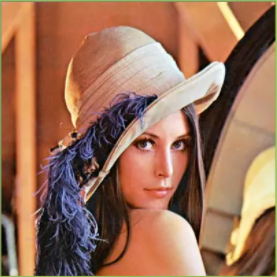

In [3]:
from google.colab.patches import cv2_imshow

cv2_imshow(img)                                         # Displaying the image in BGR

The image can be displayed using matplotlib as well. Notice that we read the image in BGR format `(Opencv uses BGR format)`. So when we try to display the image with matplotlib, something appears wrong because matplotlib assumes the BGR image was read in RGB format (matplotlib displays in RGB).

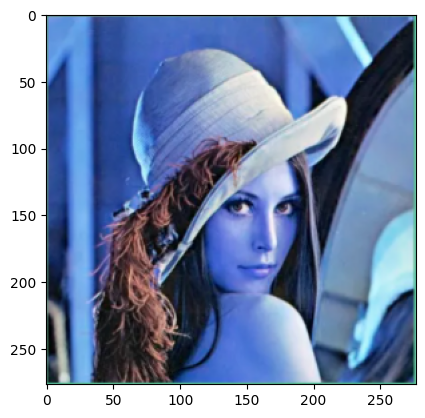

In [4]:
plt.imshow(img)    # displaying the BGR image with matplotlib

So lets convert the read BGR format image to RGB format and then plot again with matplotlib:

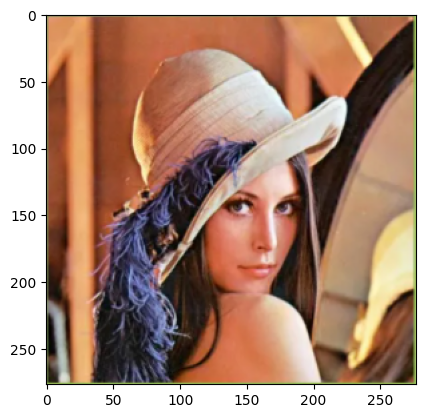

In [5]:
img_rgb_converted = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)    # image now is in RGB
plt.imshow(img_rgb_converted)

We can also manually invert the color order without using `cv2.COLOR_BGR2RGB`. Lets do so using numpy functionality.

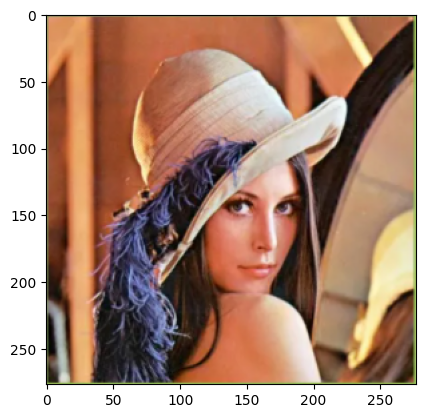

In [6]:
import numpy as np
bgr_img_numpy = np.array(img)             # img (img used cv2, so it is bgr) represented as an array

rgb_converted_img_numpy = bgr_img_numpy[:,:,::-1]       # bgr ------> rgb

from PIL import Image
rgb_converted_img = Image.fromarray(rgb_converted_img_numpy)    # rgb image
plt.imshow(rgb_converted_img)

PIL also uses RGB format. Lets demonstrate that quickly.

In [7]:
img_rgb_pil = Image.open("girl.png")                  # PIL reads in RGB format

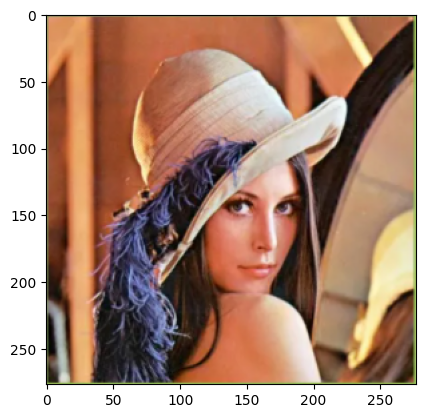

In [8]:
plt.imshow(img_rgb_pil)                               # matplotlib displaying in rgb

# Scikit-Image:

Scikit-image is easy to use, and has many great algorithms.

To see the images available check the reference for
`skimage.data`: [https://scikit-image.org/docs/stable/api/skimage.data.html]


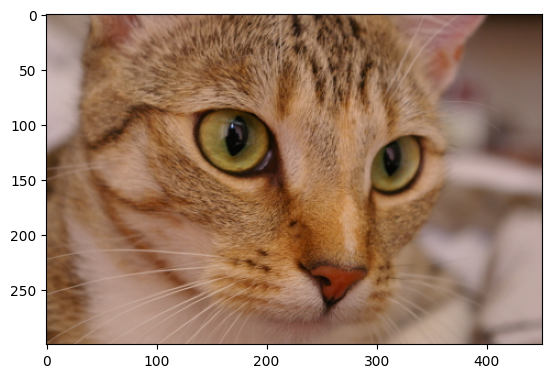

In [9]:
from skimage import data
cat_image = data.cat()
plt.imshow(cat_image)    # if you want to use OpenCV to display, convert to BGR format first

#### RGB and Grayscale Conversion:

In [10]:
np_cat = np.array(cat_image)
print(np_cat.shape)
print(np_cat)

(300, 451, 3)
[[[143 120 104]
  [143 120 104]
  [141 118 102]
  ...
  [ 45  27  13]
  [ 45  27  13]
  [ 45  27  13]]

 [[146 123 107]
  [145 122 106]
  [143 120 104]
  ...
  [ 46  29  13]
  [ 45  29  13]
  [ 47  30  14]]

 [[148 126 112]
  [147 125 111]
  [146 122 109]
  ...
  [ 48  28  17]
  [ 49  29  18]
  [ 50  30  19]]

 ...

 [[ 92  58  30]
  [105  71  43]
  [132  98  71]
  ...
  [172 145 138]
  [172 145 138]
  [172 145 138]]

 [[128  92  60]
  [139 103  71]
  [134  95  64]
  ...
  [166 142 132]
  [166 142 132]
  [167 143 133]]

 [[139 103  71]
  [127  88  57]
  [125  86  53]
  ...
  [161 137 127]
  [161 137 127]
  [162 138 128]]]


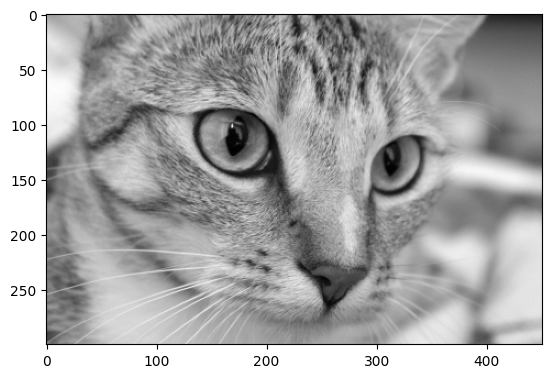

In [11]:
from skimage import color
gray_cat = color.rgb2gray(cat_image)
plt.imshow(gray_cat, cmap = 'gray')

In [12]:
np_gray = np.array(gray_cat)
print(np_gray.shape)
print(np_gray)

(300, 451)
[[0.48523098 0.48523098 0.47738784 ... 0.11692392 0.11692392 0.11692392]
 [0.49699569 0.49307412 0.48523098 ... 0.12336824 0.1225349  0.1272898 ]
 [0.50849255 0.50457098 0.49475569 ... 0.12336039 0.12728196 0.13120353]
 ...
 [0.24786745 0.29884784 0.40501294 ... 0.58914824 0.58914824 0.58914824]
 [0.38173647 0.42487373 0.39628392 ... 0.57403529 0.57403529 0.57795686]
 [0.42487373 0.36883294 0.36042431 ... 0.55442745 0.55442745 0.55834902]]


Converting an RGB image to Grayscale makes sense.

**But what happens when we convert grayscale image to RGB??**

Lets print the numpy array and see the difference by comparing it to the original cat image.

In [13]:
rgb_cat = color.gray2rgb(gray_cat)    # from original ----> grayscale ------> rgb image
np_rgb = np.array(rgb_cat)
print(np_rgb.shape)
print(np_rgb)

(300, 451, 3)
[[[0.48523098 0.48523098 0.48523098]
  [0.48523098 0.48523098 0.48523098]
  [0.47738784 0.47738784 0.47738784]
  ...
  [0.11692392 0.11692392 0.11692392]
  [0.11692392 0.11692392 0.11692392]
  [0.11692392 0.11692392 0.11692392]]

 [[0.49699569 0.49699569 0.49699569]
  [0.49307412 0.49307412 0.49307412]
  [0.48523098 0.48523098 0.48523098]
  ...
  [0.12336824 0.12336824 0.12336824]
  [0.1225349  0.1225349  0.1225349 ]
  [0.1272898  0.1272898  0.1272898 ]]

 [[0.50849255 0.50849255 0.50849255]
  [0.50457098 0.50457098 0.50457098]
  [0.49475569 0.49475569 0.49475569]
  ...
  [0.12336039 0.12336039 0.12336039]
  [0.12728196 0.12728196 0.12728196]
  [0.13120353 0.13120353 0.13120353]]

 ...

 [[0.24786745 0.24786745 0.24786745]
  [0.29884784 0.29884784 0.29884784]
  [0.40501294 0.40501294 0.40501294]
  ...
  [0.58914824 0.58914824 0.58914824]
  [0.58914824 0.58914824 0.58914824]
  [0.58914824 0.58914824 0.58914824]]

 [[0.38173647 0.38173647 0.38173647]
  [0.42487373 0.4248737

In [14]:
np_cat = np.array(cat_image)     # original cat image
print(np_cat.shape)
print(np_cat)

(300, 451, 3)
[[[143 120 104]
  [143 120 104]
  [141 118 102]
  ...
  [ 45  27  13]
  [ 45  27  13]
  [ 45  27  13]]

 [[146 123 107]
  [145 122 106]
  [143 120 104]
  ...
  [ 46  29  13]
  [ 45  29  13]
  [ 47  30  14]]

 [[148 126 112]
  [147 125 111]
  [146 122 109]
  ...
  [ 48  28  17]
  [ 49  29  18]
  [ 50  30  19]]

 ...

 [[ 92  58  30]
  [105  71  43]
  [132  98  71]
  ...
  [172 145 138]
  [172 145 138]
  [172 145 138]]

 [[128  92  60]
  [139 103  71]
  [134  95  64]
  ...
  [166 142 132]
  [166 142 132]
  [167 143 133]]

 [[139 103  71]
  [127  88  57]
  [125  86  53]
  ...
  [161 137 127]
  [161 137 127]
  [162 138 128]]]


Thus we can see that converting an RGB image to Grayscale and back to RGB causes all the channels to have the same pixel values as the grayscale. So indeed, the original information is lost.

### Numpy for Images:

1. The 3 color channels can be sliced as the following:

In [15]:
r = cat_image[:,:,0]
g = cat_image[:,:,1]
b = cat_image[:,:,2]

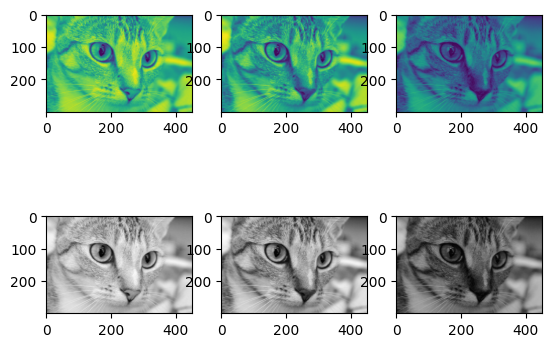

In [16]:
plt.subplot(2,3,1)
plt.imshow(r)

plt.subplot(2,3,2)
plt.imshow(g)

plt.subplot(2,3,3)
plt.imshow(b)


# Same above images can be shown in grayscale format as:

plt.subplot(2,3,4)
plt.imshow(r, cmap = 'gray')

plt.subplot(2,3,5)
plt.imshow(g, cmap = 'gray')

plt.subplot(2,3,6)
plt.imshow(b, cmap = 'gray')

2. Shape and Sizes:

In [17]:
print(cat_image.shape)
print(cat_image.size)

(300, 451, 3)
405900


3. Flipping image:

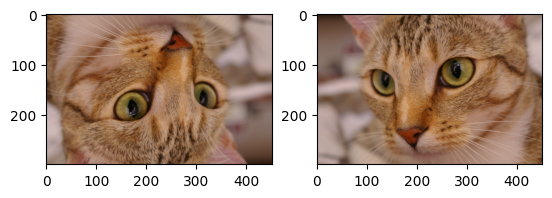

In [18]:
vertical_flip = np.flipud(cat_image)
horizontal_flip = np.fliplr(cat_image)

plt.subplot(1,2,1)
plt.imshow(vertical_flip)

plt.subplot(1,2,2)
plt.imshow(horizontal_flip)

## Histogram:

Histogram is a graphical representation for the amount of pixels of each intensity value.
* X-axis = Pixel value
* Y-axis = No of occurence of that pixel value

Histogram is used for:
* Thresholding
* Brightness and contrast altering
* Equalize an image

Matplotlib as hist method, that takes arguments:
* Input array (frequency)
* Bins (lets set bins to 256 to show count for every pixels)


(array([4.700e+01, 4.400e+01, 6.800e+01, 1.160e+02, 1.380e+02, 1.860e+02,
        2.140e+02, 2.540e+02, 2.590e+02, 2.850e+02, 0.000e+00, 3.120e+02,
        3.010e+02, 2.800e+02, 2.860e+02, 2.980e+02, 3.380e+02, 3.190e+02,
        3.420e+02, 3.300e+02, 0.000e+00, 3.430e+02, 3.420e+02, 3.430e+02,
        4.100e+02, 4.240e+02, 3.880e+02, 4.270e+02, 4.230e+02, 4.430e+02,
        0.000e+00, 4.230e+02, 4.030e+02, 4.940e+02, 4.750e+02, 5.190e+02,
        5.160e+02, 5.390e+02, 5.710e+02, 5.570e+02, 0.000e+00, 5.850e+02,
        5.610e+02, 6.240e+02, 6.180e+02, 6.320e+02, 7.100e+02, 6.790e+02,
        7.080e+02, 7.540e+02, 7.610e+02, 0.000e+00, 7.680e+02, 8.560e+02,
        8.940e+02, 9.440e+02, 9.470e+02, 9.730e+02, 1.050e+03, 1.083e+03,
        1.121e+03, 0.000e+00, 1.092e+03, 1.164e+03, 1.181e+03, 1.216e+03,
        1.176e+03, 1.247e+03, 1.219e+03, 1.184e+03, 1.279e+03, 0.000e+00,
        1.377e+03, 1.303e+03, 1.329e+03, 1.292e+03, 1.422e+03, 1.415e+03,
        1.427e+03, 1.431e+03, 1.355e+0

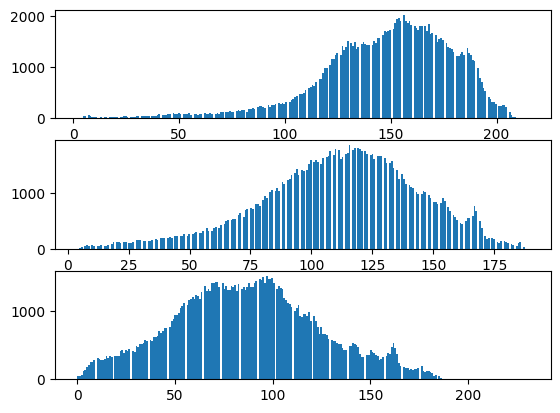

In [19]:
plt.subplot(3,1,1)
plt.hist(r.ravel(), bins = 256)    # red

plt.subplot(3,1,2)
plt.hist(g.ravel(), bins = 256)   # green

plt.subplot(3,1,3)
plt.hist(b.ravel(), bins = 256)   # blue

## Thresholding:
It refers to partioning an image into foreground and background (of grayscale images), into black and white. Thus this works best in high contrast images.

It is the simplest method of segmentation.

* if pixel >threshold, make it 255
* if pixel < threshold, make it 0

Conversely, we can do inverted thresholding: black for foreground, white for background.

#### Types of Thresholding:

1. Global:
  * Histogram-based
  * Good for uniform background
  * Few algorithms: **Isodata, minimum, otsu,Li, mean, triangle, yen**

2. Local:
  * Adaptive
  * Good for uneven backgroung illumination
  * Good for less contrast in the image.

**Note**: Skimage offers `try_all_threshold`, we can import it and evaluate.

1. Global thresholding with manually picked threshold value.

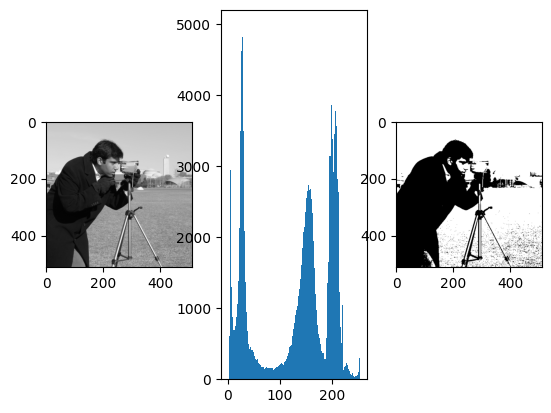

In [20]:
thresh  = 127     # suppose

camera = data.camera()
binary = camera > thresh

plt.subplot(1,3,1)
plt.imshow(camera, cmap = 'gray')

plt.subplot(1,3,2)
plt.hist(camera.ravel(), bins = 256)

plt.subplot(1,3,3)
plt.imshow(binary, cmap = 'gray')

2. Global Thresholding with optimum threshold value picked through `threshold_otsu`

Choosen threshold is 102


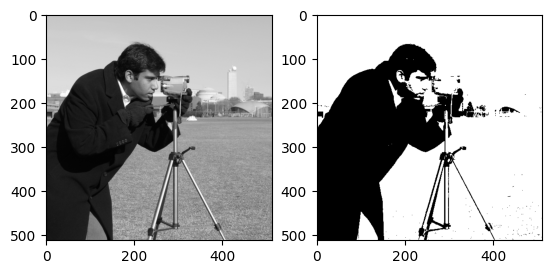

In [21]:
from skimage.filters import threshold_otsu
thresh = threshold_otsu(camera)         #optimum threshold value
print("Choosen threshold is",thresh)
binary = camera > thresh

plt.subplot(1,2,1)
plt.imshow(camera, cmap = 'gray')

plt.subplot(1,2, 2)
plt.imshow(binary, cmap = 'gray')

3. Local thresholding:

This approach is used when the distrubution of the image intensities across the entire image shows less variation, but there are local variations within small regions. Thus, the approach is to divide the entire image to small local regions that surround a pixel of interest. Thus we define a `block_size`.

We also require an `offset` value, because the local threshold is calculated by subtracting the offset from the mean of the pixel intensities. The default is zero. Some choices are mean filter, gaussian filter, median,etc..

Reference: [https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.threshold_local]

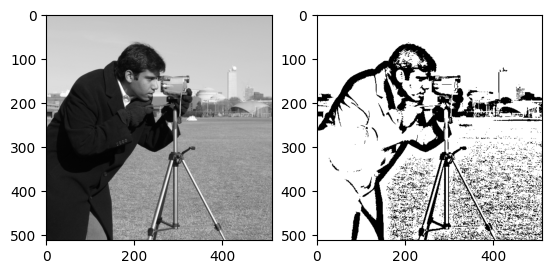

In [22]:
from skimage.filters import threshold_local
local_thresh = threshold_local(camera, block_size = 35, method = 'mean', offset = 10)   # local threshold chosen

binary_local = camera > local_thresh

plt.subplot(1,2,1)
plt.imshow(camera, cmap = 'gray')

plt.subplot(1,2, 2)
plt.imshow(binary_local, cmap = 'gray')

4. Try_all_threshold:


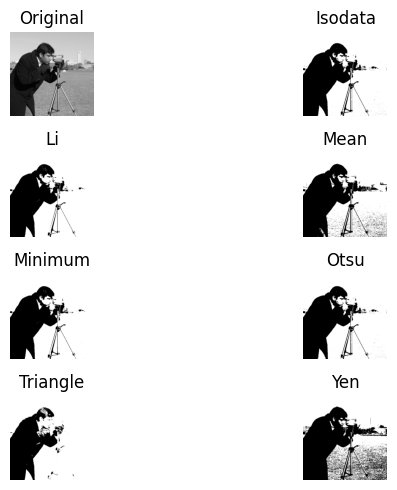

In [23]:
from skimage.filters import try_all_threshold
from skimage import color
#gray_camera = color.rgb2gray(camera)              # Need to convert to grayscale

fig,ax = try_all_threshold(camera, verbose = False)
plt.show()

## Filtering:

Filtering helps emphasize or remove features. It is used for smoothing, sharpening and edge detection in the images. Like the histogram equilization, its also a neighbourhood approach.

1. Sobel filter for `Edge detection`

Edge detection involves finding out the change in intensities in X and Y direction in a grayscale image. You can see the full mathematics of edge detection here:

Sobel Derivation: [https://nrsyed.com/2018/02/18/edge-detection-in-images-how-to-derive-the-sobel-operator/]


* Sobel filter in X direction:

  `| 1  0  -1|` \\
  `| 2  0  -2|` \\
  `| 1  0  -1|`

* Sobel filter in Y direction:

  `| 1   2   1|` \\
  `| 0   0   0|` \\
  `|-1  -2  -1|`

**1.A. Sobel from Scratch**:

Lets try to implement sobel operation from scratch with numpy first. Then we will use the sobel operator from the library.

In [24]:
camera_numpy = np.array(camera)                # numpy array of the single channel image
print(camera_numpy)

[[200 200 200 ... 189 190 190]
 [200 199 199 ... 190 190 190]
 [199 199 199 ... 190 190 190]
 ...
 [ 25  25  27 ... 139 122 147]
 [ 25  25  26 ... 158 141 168]
 [ 25  25  27 ... 151 152 149]]


In [25]:
xsobel = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])         # define sobel in x direction
print(xsobel)

[[-1  0  1]
 [-2  0  2]
 [-1  0  1]]


In [26]:
ysobel = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])         # define sobel in y direction
print(ysobel)

[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]


We need to perform convolution operation between the image array and the sobel kernel. So lets define a convolution function.

We will need the following knowledge for the convolution operation:

* Pad Image (I) with 0 in the order: `((up,down),(left,right))`

* Obtain the 3*3 `Patch` of the image (to perform convolution with kernel k).
  * Obtain rows from `i` to `i+kernel_height`
  * Obtain columns from `j` to `j+kernel_width`

* Element wise multiplication of patch (I) and Kernel (k). `Patch*k` or `np.multiply(Patch,k)`

* Sum the element wise multiplication inside a loop.

In [27]:
def convolution2d(image, kernel):

  image_height = image.shape[0]
  image_width = image.shape[1]
  kernel_height = kernel.shape[0]
  kernel_width = kernel.shape[1]
  pad_height = kernel_height // 2
  pad_width = kernel_width // 2

  output = np.zeros((image_height, image_width))              # Initialize the output image

  padded = np.pad(image,((pad_height, pad_height), (pad_width, pad_width)), mode = 'constant')   # paddded on ((up,down),(left,right))

  for i in range(image_height):
    for j in range(image_width):
      patch = padded[i: i+kernel_height, j: j+kernel_width]                                      # image patch extracted (in the next inner loop slide the patch rightwards by stride = 1) (In the outer loop, patch slides downward by 1) (combined loop gives patch size = kernel size)

      output[i,j] = np.sum(patch * kernel)                                                      # Convolution sum

  return output

In [28]:
xsobel_output = convolution2d(camera_numpy, xsobel)      # edge detection in x axis
ysobel_output = convolution2d(camera_numpy, ysobel)      # edge detection in y axis

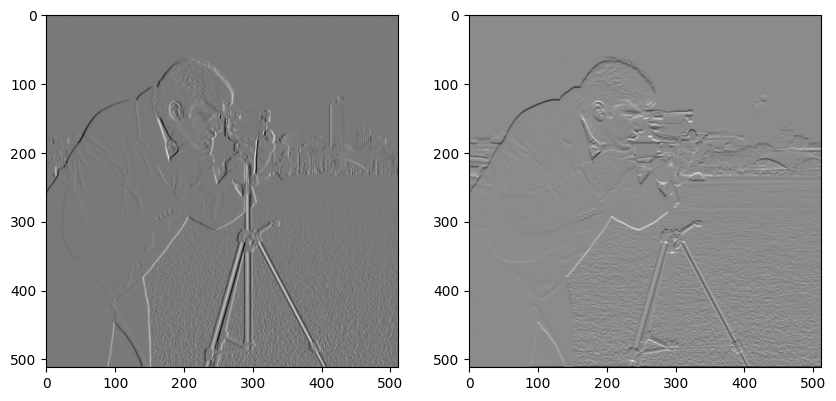

In [29]:
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.imshow(xsobel_output, cmap = 'gray')

plt.subplot(1,2,2)
plt.imshow(ysobel_output, cmap = 'gray')

Voila we detected edges in x and y direction! Now lets find out the combined edge detection, using the gradients.

In [30]:
total_sobel_output = np.sqrt(xsobel_output ** 2, ysobel_output ** 2)
print(total_sobel_output)

[[599.   1.   1. ...   2.   2. 570.]
 [797.   2.   3. ...   1.   1. 760.]
 [797.   2.   2. ...   0.   0. 760.]
 ...
 [101.   6.   5. ... 129.  38. 534.]
 [100.   6.   3. ...  42.  26. 556.]
 [ 75.   5.   1. ...  18.   6. 445.]]


We can see the values are out of range 0-255. So let's normalize them to that range.

In [31]:
total_sobel_output = (total_sobel_output / np.max(total_sobel_output)) * 255
print(total_sobel_output)

[[161.12341772   0.26898734   0.26898734 ...   0.53797468   0.53797468
  153.32278481]
 [214.38291139   0.53797468   0.80696203 ...   0.26898734   0.26898734
  204.43037975]
 [214.38291139   0.53797468   0.53797468 ...   0.           0.
  204.43037975]
 ...
 [ 27.16772152   1.61392405   1.34493671 ...  34.69936709  10.22151899
  143.63924051]
 [ 26.89873418   1.61392405   0.80696203 ...  11.29746835   6.99367089
  149.55696203]
 [ 20.17405063   1.34493671   0.26898734 ...   4.84177215   1.61392405
  119.69936709]]


We can see that the values are in floating points. So lets convert them to integers.

In [32]:
total_sobel_output = total_sobel_output.astype(np.uint8)
print(total_sobel_output)

[[161   0   0 ...   0   0 153]
 [214   0   0 ...   0   0 204]
 [214   0   0 ...   0   0 204]
 ...
 [ 27   1   1 ...  34  10 143]
 [ 26   1   0 ...  11   6 149]
 [ 20   1   0 ...   4   1 119]]


The values seem ok. Lets plot it and see the overall edges detected.

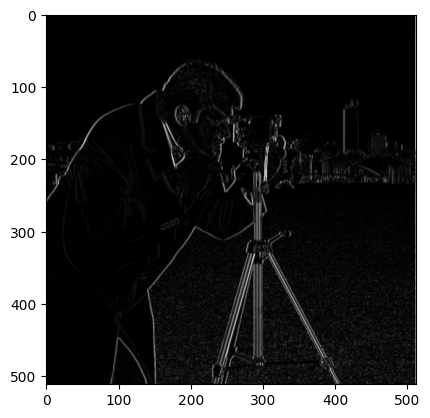

In [33]:
plt.imshow(total_sobel_output, cmap = 'gray')

**1.B.Sobel operation using library**:

Now that we have completed the edge detection from scratch, let's use sobel method implemented in the skimage.filters, and compare the output.

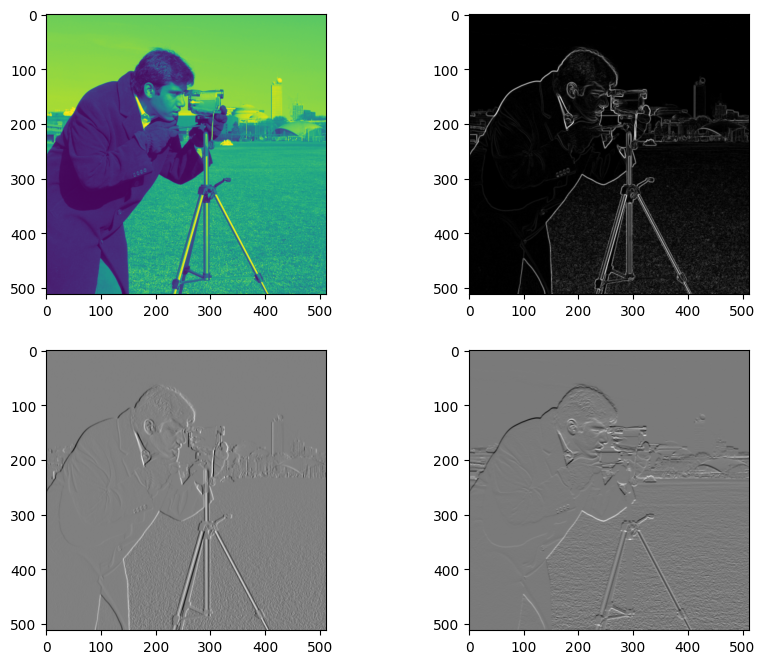

In [34]:
from skimage.filters import sobel, sobel_v, sobel_h

total_sobel = sobel(camera)      # all edges (computes sqrt of both gradients)
x_sobel = sobel_h(camera)        # for horizontal edges
y_sobel = sobel_v(camera)        # for vertical edges


plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
plt.imshow(camera)

plt.subplot(2,2,2)
plt.imshow(total_sobel, cmap = 'gray')

plt.subplot(2,2,4)
plt.imshow(x_sobel, cmap = 'gray')

plt.subplot(2,2,3)
plt.imshow(y_sobel, cmap = 'gray')

2. Laplace filter for `Edge detection`

* The major difference between Laplace filter and sobel filter is that this filter computes the `second order derivative` (Laplacian means sum of second order derivatives) while sobel is a first order derivative filter. Laplace filter highlights areas in which intensity changes rapidly producing a picture of all the edges in an image.

* This filter is sensitive to noise, thus gaussian smoothing is often done to remove gaussian noise.

* Isotropic: Responds equally to `edges in all directions`. (unlike Sobel filter, which responds to edges in specific directions.)

The filter looks like:

  `| 0  1   0|` \\
  `| 1  4   1|` \\
  `| 0  1   0|`

Reference: [https://homepages.inf.ed.ac.uk/rbf/HIPR2/log.htm]

\
Since you get the idea, we won't be doing scratch implementation from now on.

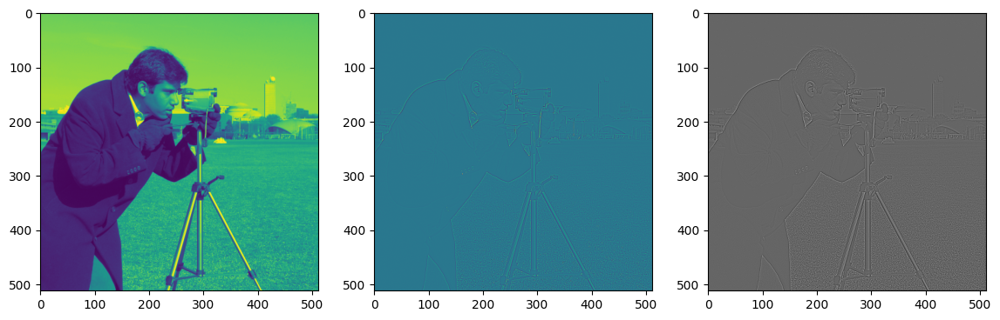

In [35]:
from skimage.filters import laplace

edge_laplace = laplace(camera)

plt.figure(figsize=(14,6))
plt.subplot(1,3,1)
plt.imshow(camera)
plt.subplot(1,3,2)
plt.imshow(edge_laplace)
plt.subplot(1,3,3)
plt.imshow(edge_laplace, cmap = 'gray')

2. Gaussian smoothing:

Smoothing referes to the removal of noise or fine details. Thus, image will be blurred especially in the edges.  Gaussian filter assigns a higher weight to the central pixel and lower weights to the surrounding pixels, following a Gaussian distribution.  This process smooths the image, reducing high-frequency components (noise), which decreases the variance of the pixel intensity distribution. As a result, the image becomes less sharp, and edges may become blurred.

Note that smoothing may result in lower contrast as a side effect. What do I mean by that? Well, in a histogram, the Y-axis referes to count, X-axis refers to the pixel values. After Gaussian smoothing, the histogram might shift downwards slightly, indicating a decrease in the number of pixels at extreme values, contributing to lower overall contrast.

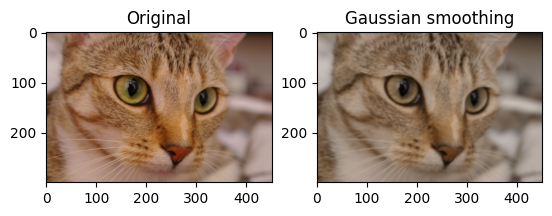

In [36]:
from skimage.filters import gaussian
gauss = gaussian(cat_image)

plt.subplot(1,2,1)
plt.title('Original')
plt.imshow(cat_image)

plt.subplot(1,2,2)
plt.title('Gaussian smoothing')
plt.imshow(gauss)

(array([  20.,   60.,  111.,  122.,  106.,  118.,   82.,   73.,   76.,
          73.,  112.,  138.,  148.,  148.,  145.,  169.,  178.,  159.,
         192.,  193.,  246.,  246.,  226.,  274.,  278.,  313.,  305.,
         275.,  305.,  304.,  346.,  347.,  323.,  376.,  311.,  349.,
         363.,  354.,  392.,  367.,  368.,  381.,  438.,  402.,  410.,
         439.,  468.,  497.,  428.,  492.,  530.,  505.,  520.,  575.,
         549.,  565.,  624.,  578.,  642.,  615.,  677.,  700.,  667.,
         679.,  730.,  767.,  797.,  817.,  868.,  884.,  892.,  973.,
        1015.,  993., 1036., 1077., 1059., 1123., 1133., 1231., 1255.,
        1292., 1390., 1377., 1373., 1354., 1458., 1478., 1524., 1583.,
        1740., 1818., 1671., 1761., 1841., 1855., 1929., 1935., 1954.,
        1977., 2045., 2089., 2096., 2123., 2149., 2121., 2239., 2393.,
        2346., 2294., 2454., 2408., 2337., 2442., 2500., 2609., 2485.,
        2541., 2662., 2749., 2724., 2853., 2965., 2871., 2961., 3105.,
      

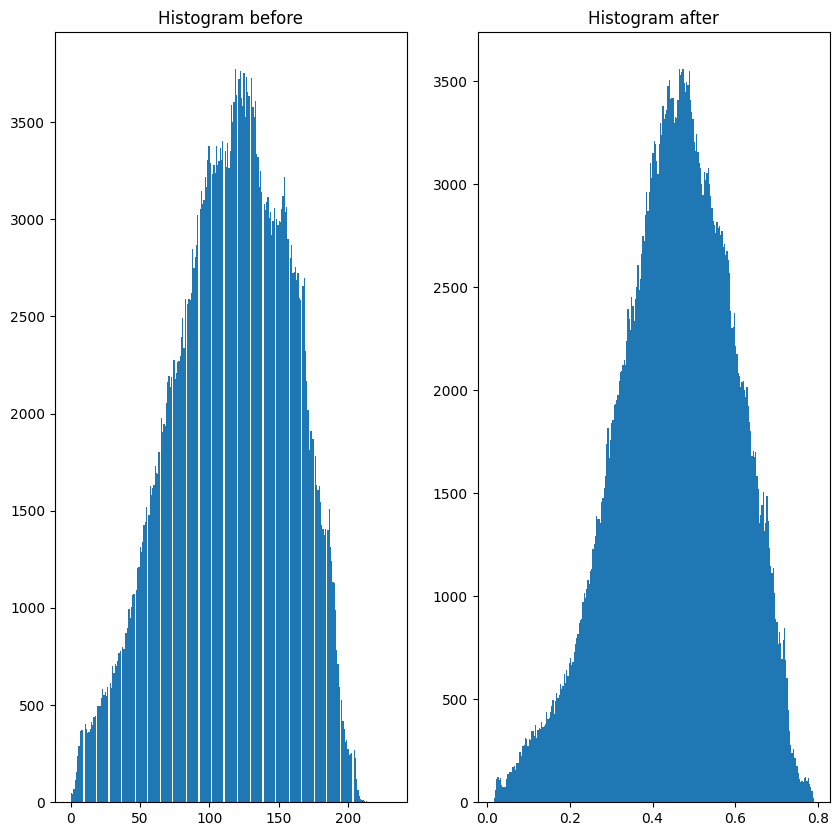

In [37]:
plt.figure(figsize = (10,10))
plt.subplot(1,2,1)
plt.title('Histogram before')
plt.hist(cat_image.ravel(), bins = 256)

plt.subplot(1,2,2)
plt.title('Histogram after')
plt.hist(gauss.ravel(), bins = 256)

## Contrast Enhancement:

Contrast refers to the difference in intensity between the darkest and brightest parts of an image. High contrast means a wide spread of pixel values, whereas low contrast means a narrow spread. it can be done by spreading the histogram across a wider range. A few algorithms are:

1. Standard Histogram equalization
2. Adaptive Histogram equalixation
3. Contrast Limited Adaptie Histogram Equalization (CLAHE)

  * An algorithm for local contrast enhancement, that uses histograms computed over different tile regions of the image. Local details can therefore be enhanced even in regions that are darker or lighter than most of the image.

  * clip_limit : Normalized between 0 and 1. Higher value gives more contrast.

  * Reference: [https://scikit-image.org/docs/stable/api/skimage.exposure.html#skimage.exposure.equalize_adapthist]

/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


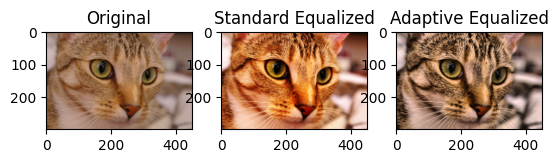

In [38]:
from skimage.exposure import equalize_hist,  equalize_adapthist

equalized = equalize_hist(cat_image)                                                        # simple equalization
equalized1 = (equalized/np.max(equalized))*255
equalized2 = equalized1.astype((np.uint8))

adapt_equalized = equalize_adapthist(cat_image, clip_limit = 0.015)                             # adaptive equalization
adapt_equalized1 = (adapt_equalized/np.max(adapt_equalized))*255
adapt_equalized2 = adapt_equalized1.astype((np.uint8))

plt.subplot(1,3,1)
plt.title('Original')
plt.imshow(cat_image)


plt.subplot(1,3,2)
plt.title('Standard Equalized')
plt.imshow(equalized2)

plt.subplot(1,3,3)
plt.title('Adaptive Equalized')
plt.imshow(adapt_equalized2)

(array([4.030e+02, 5.870e+02, 8.250e+02, 9.100e+02, 9.290e+02, 1.071e+03,
        1.078e+03, 1.059e+03, 1.150e+03, 1.181e+03, 1.234e+03, 1.197e+03,
        1.261e+03, 1.290e+03, 1.319e+03, 1.343e+03, 1.397e+03, 1.344e+03,
        1.440e+03, 1.453e+03, 1.543e+03, 1.471e+03, 1.492e+03, 1.464e+03,
        1.617e+03, 1.642e+03, 1.616e+03, 1.623e+03, 1.696e+03, 1.661e+03,
        1.674e+03, 1.760e+03, 1.703e+03, 1.742e+03, 1.808e+03, 1.871e+03,
        1.763e+03, 1.816e+03, 1.842e+03, 1.843e+03, 1.806e+03, 1.866e+03,
        1.855e+03, 1.892e+03, 1.903e+03, 1.837e+03, 1.835e+03, 1.952e+03,
        1.881e+03, 1.927e+03, 1.961e+03, 1.912e+03, 1.869e+03, 1.920e+03,
        1.912e+03, 1.875e+03, 1.898e+03, 1.897e+03, 1.988e+03, 1.934e+03,
        1.907e+03, 1.992e+03, 1.934e+03, 1.938e+03, 1.920e+03, 2.034e+03,
        2.027e+03, 2.005e+03, 1.917e+03, 1.978e+03, 2.087e+03, 1.965e+03,
        2.057e+03, 2.021e+03, 2.057e+03, 1.960e+03, 2.018e+03, 2.053e+03,
        2.079e+03, 2.067e+03, 2.032e+0

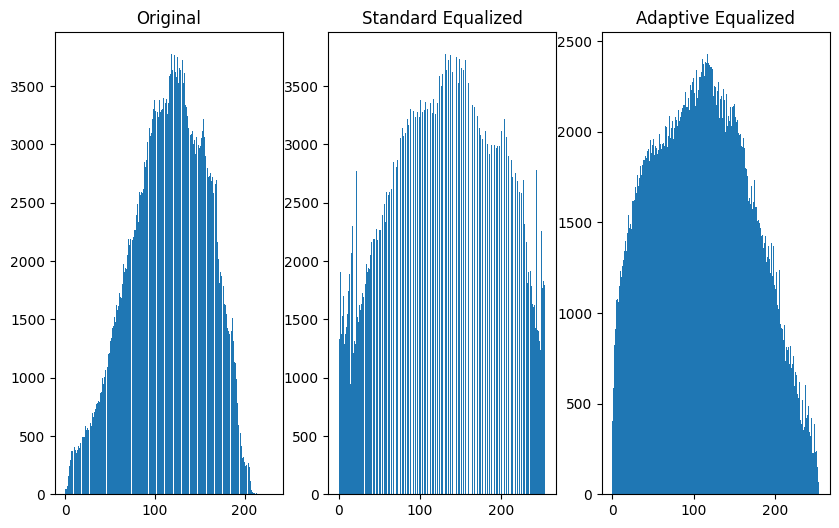

In [39]:
plt.figure(figsize = (10,6))
plt.subplot(1,3,1)
plt.title('Original')
plt.hist(cat_image.ravel(), bins = 256)


plt.subplot(1,3,2)
plt.title('Standard Equalized')
plt.hist(equalized2.ravel(), bins = 256)

plt.subplot(1,3,3)
plt.title('Adaptive Equalized')
plt.hist(adapt_equalized2.ravel(), bins = 256)

## Transformation:

1. Rotation:

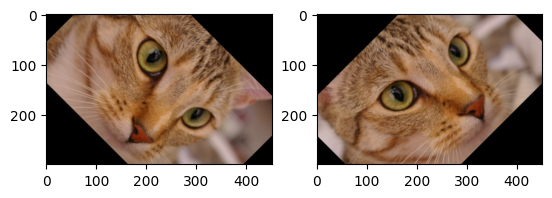

In [40]:
from skimage.transform import rotate

clock = rotate(cat_image, -45)
anti_clock = rotate(cat_image, 45)

plt.subplot(1,2,1)
plt.imshow(clock)
plt.subplot(1,2,2)
plt.imshow(anti_clock)

2. Rescale:

Here the rescaling factor is defined. Since it multiplies the channel by the factor as well, lets use the grayscale image.

(300, 451)
(150, 226)
(600, 902)


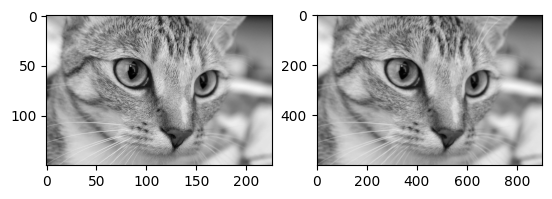

In [41]:
from skimage.transform import rescale

half_rescaled = rescale(gray_cat, 1/2)
twice_rescaled = rescale(gray_cat, 2)

print(gray_cat.shape)
print(half_rescaled.shape)
print(twice_rescaled.shape)

plt.subplot(1,2,1)
plt.imshow(half_rescaled, cmap = 'gray')
plt.subplot(1,2,2)
plt.imshow(twice_rescaled, cmap = 'gray')

3. Resize:

Unlike rescale, it allows us to specify the output shape.

(300, 451)
(150, 226)
(800, 1000)


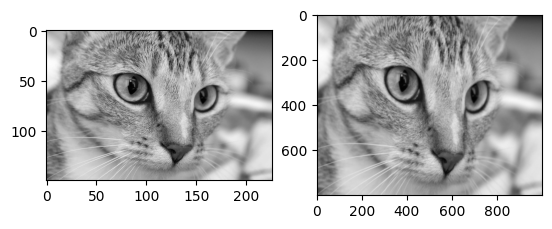

In [42]:
from skimage.transform import resize

resized1 = resize(gray_cat, (150,226))
resized2 = resize(gray_cat, (800,1000))

print(gray_cat.shape)
print(resized1.shape)
print(resized2.shape)

plt.subplot(1,2,1)
plt.imshow(resized1, cmap = 'gray')
plt.subplot(1,2,2)
plt.imshow(resized2, cmap = 'gray')

It works perfectly for mutliple channels too, so lets try it. Instead of doing the same thing for colored image, lets compare the effect of setting `anti_aliasing` as true or false instead.

* If set to true, the image is smoothed (using Gaussian filter) before downsampling to reduce aliasing effect. It is set to True when downsampling an image whose data type is not bool.

* If set to false, no smoothing.

(300, 451, 3)
(150, 226, 3)
(150, 226, 3)


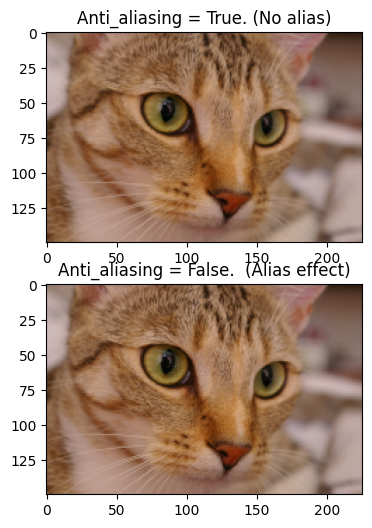

In [43]:
from skimage.transform import resize

resized3 = resize(cat_image, (150,226), anti_aliasing = True)
resized4 = resize(cat_image, (150,226), anti_aliasing = False)

print(cat_image.shape)
print(resized3.shape)
print(resized4.shape)

plt.figure(figsize=(10,6))
plt.subplot(2,1,1)
plt.title('Anti_aliasing = True. (No alias)')
plt.imshow(resized3)

plt.subplot(2,1,2)
plt.title('Anti_aliasing = False.  (Alias effect)')
plt.imshow(resized4)

## Morphology:

* Utilities that operate on shapes in images.

* These operations are particularly suited for binary images, although some may be useful for images of other types as well.

* Basic morphological operations include:

  1. Dilation: Add pixel to boundaries

  2. Erosion: Remove pixels from boundaries.

* Structuring element:

  * This is the footprint (or shape) that is aligned to the object of concern in the image.

  * Dictates the number of pixels to add or remove.

  * It could be of different shape. We choose the structuring element's shape that is closely related to the actual object in the image.For example, if the object(whose boundary is our concern) in the image is circular in shape, "disk" structural element may be more suitable than "rectangle" element.

Now we perfom the erosion and dilation operation.

(328, 400)
uint8


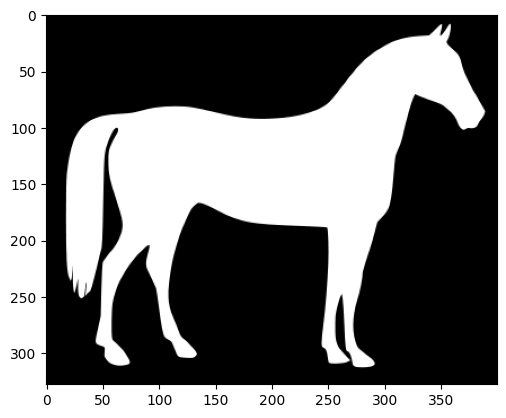

In [44]:
horse_gray = cv2.imread('horse_r.png', cv2.IMREAD_GRAYSCALE)
print(horse_gray.shape)
print(horse_gray.dtype)
plt.imshow(horse_gray, cmap = 'gray')

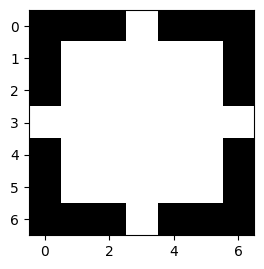

In [45]:
from skimage import morphology
shape_disk = morphology.disk(3)
plt.subplot(1,2,2)
plt.imshow(shape_disk, cmap = 'gray')

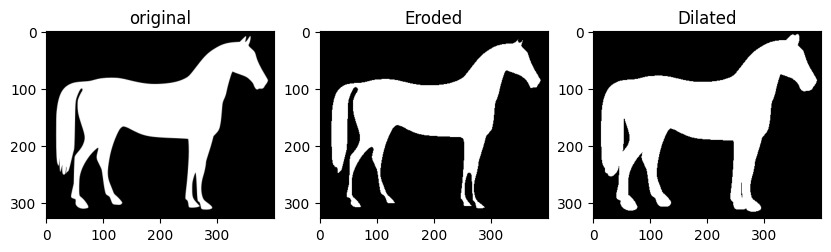

In [46]:
eroded = morphology.binary_erosion(horse_gray, footprint = shape_disk)

dilated = morphology.binary_dilation(horse_gray, footprint = shape_disk)

plt.figure(figsize=(10,6))
plt.subplot(1,3,1)
plt.title('original')
plt.imshow(horse_gray, cmap ='gray')

plt.subplot(1,3,2)
plt.title('Eroded')
plt.imshow(eroded, cmap = 'gray')

plt.subplot(1,3,3)
plt.title('Dilated')
plt.imshow(dilated, cmap = 'gray')

Same morphology operation using opencv:

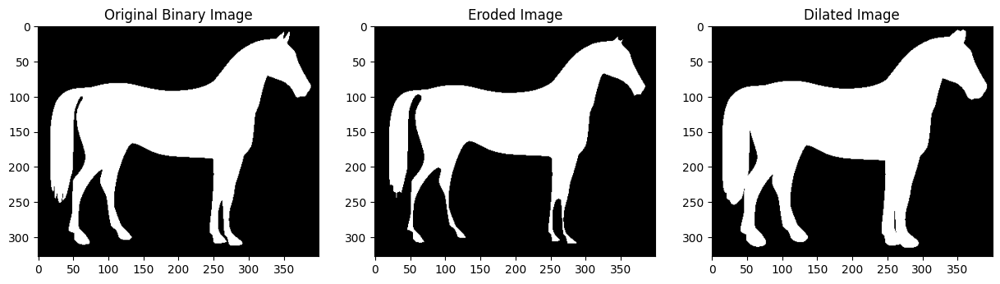

In [47]:
import cv2

horse_image = cv2.imread('horse_r.png', cv2.IMREAD_GRAYSCALE)

# Otsu's thresholding to convert the image to binary
_, horse_binary = cv2.threshold(horse_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Create a structuring element (kernel)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))

eroded = cv2.erode(horse_binary, kernel, iterations=1)                      # erosion

dilated = cv2.dilate(horse_binary, kernel, iterations=1)                     # dilation

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title('Original Binary Image')
plt.imshow(horse_binary, cmap='gray')
plt.subplot(1, 3, 2)
plt.title('Eroded Image')
plt.imshow(eroded, cmap='gray')
plt.subplot(1, 3, 3)
plt.title('Dilated Image')
plt.imshow(dilated, cmap='gray')
plt.show()


## Image Restoration:

It is the process of recovering an image that had been damaged by noise, blur and other distortion. An image is often damaged during the acquisition and storing process, thus restoring is a valuable tool.

The application of Image restoration could be fixing damages logo removal, tattoo removal, etc. Digital inpainting methods can be used to restore the damaged portion in the image by ooking at the non-damaged regions.

Lets create a mask (or black "damaged" part) on a perfectly fine image. Then apply inpainting method to restore that area.

(300, 451)


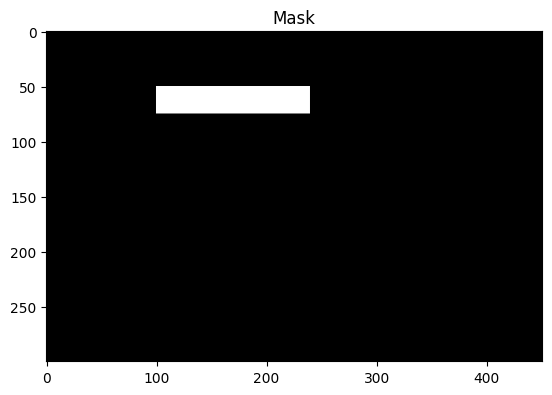

In [48]:
mask = np.zeros(cat_image.shape[:-1], dtype=np.uint8)
mask[50:75, 100:240] = 1                                    # region to mask
print(mask.shape)

plt.title('Mask')
plt.imshow(mask, cmap='gray')

Lets apply the above black mask to the image of the cat. We do so by using the above `mask`. **We keep the masked region as same in the damaged image** Also we make a copy of 'cat_image' as `damaged_image` instead of damaging the original one.

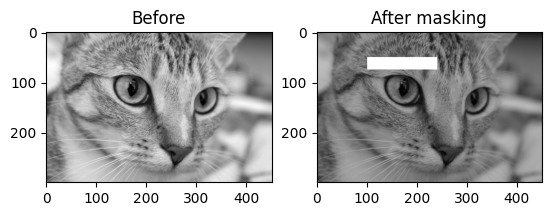

In [49]:
damaged_image = gray_cat.copy()
plt.subplot(1,2,1)
plt.title('Before')
plt.imshow(damaged_image, cmap ='gray')

damaged_image[mask == 1] = 1
plt.subplot(1,2,2)
plt.title('After masking')
plt.imshow(damaged_image, cmap = 'gray')

In [50]:
print(damaged_image.shape)
print(mask.shape)

(300, 451)
(300, 451)


Now we can restore the black region using inpainting method. Lets try with inpaint_biharmonic method.

In [51]:
from skimage.restoration import inpaint

restored_biharmonic = inpaint.inpaint_biharmonic(damaged_image, mask)

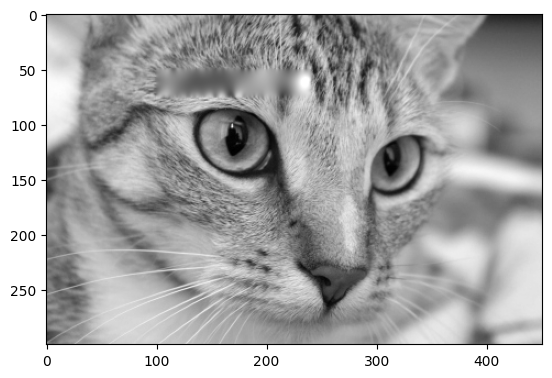

In [52]:
plt.imshow(restored_biharmonic, cmap = 'gray')

## Noise:

Noise occurs in image during the error in image acquisition process. As a result, the image distribution is deviated from the actual scene as viewed by the human eyes.

Using scikit image, we use random_noise method, and the type of noise such as gaussian noise or salt and pepper noise is specified in the parameter called mode.

(array([2.0377e+04, 4.1000e+01, 6.7000e+01, 1.1100e+02, 1.5000e+02,
        2.3000e+02, 2.7400e+02, 3.5600e+02, 3.5300e+02, 3.5400e+02,
        0.0000e+00, 3.8900e+02, 3.5700e+02, 3.3900e+02, 3.4400e+02,
        3.6500e+02, 3.9000e+02, 3.8000e+02, 4.1900e+02, 4.1900e+02,
        4.6900e+02, 0.0000e+00, 4.7000e+02, 4.6800e+02, 5.0600e+02,
        5.5500e+02, 5.2500e+02, 5.3800e+02, 5.3200e+02, 5.5600e+02,
        5.8000e+02, 0.0000e+00, 5.6400e+02, 6.5300e+02, 6.3000e+02,
        6.7200e+02, 6.6800e+02, 6.8800e+02, 7.3300e+02, 7.3800e+02,
        7.5800e+02, 7.5400e+02, 0.0000e+00, 8.3100e+02, 8.3400e+02,
        8.5100e+02, 9.3500e+02, 9.1500e+02, 9.4800e+02, 1.0030e+03,
        1.0180e+03, 1.0230e+03, 1.1380e+03, 0.0000e+00, 1.1510e+03,
        1.2410e+03, 1.2100e+03, 1.2710e+03, 1.3540e+03, 1.3670e+03,
        1.4430e+03, 1.3980e+03, 1.5500e+03, 0.0000e+00, 1.5020e+03,
        1.5320e+03, 1.5540e+03, 1.6410e+03, 1.6020e+03, 1.5900e+03,
        1.7170e+03, 1.8810e+03, 1.8170e+03, 1.84

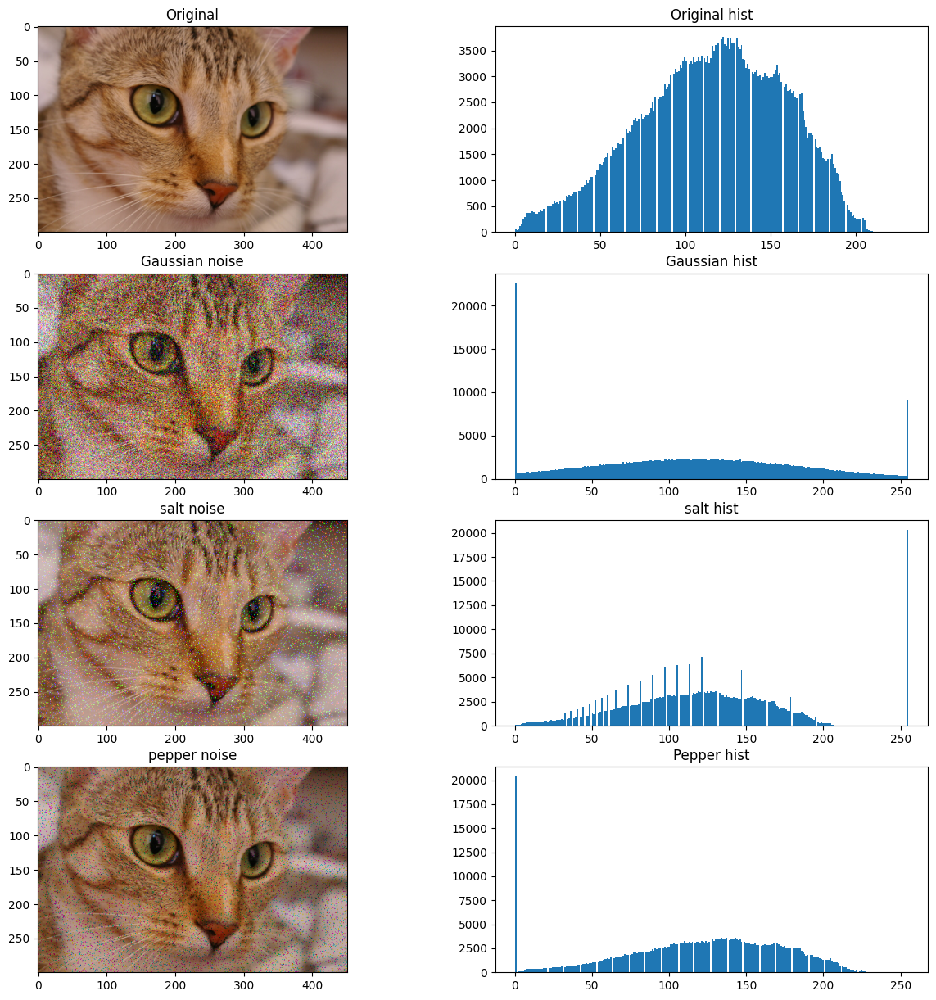

In [53]:
from skimage.util import random_noise

cat_gaussian_noise = random_noise(cat_image, mode = 'gaussian', var = 0.05)
cat_salt_noise = random_noise(cat_image, mode ='salt')
cat_pepper_noise = random_noise(cat_image, mode = 'pepper')

plt.figure(figsize =(15,15))
plt.subplot(4,2,1)
plt.title('Original')
plt.imshow(cat_image)
plt.subplot(4,2,2)
plt.title('Original hist')
plt.hist(cat_image.ravel(), bins = 256)

plt.subplot(4,2,3)
plt.title('Gaussian noise')
plt.imshow(cat_gaussian_noise)
plt.subplot(4,2,4)
plt.title('Gaussian hist')
cat_gaussian_noise = (cat_gaussian_noise/np.max(cat_gaussian_noise)*255).astype(np.uint8)
plt.hist(cat_gaussian_noise.ravel(), bins = 256)

plt.subplot(4,2,5)
plt.title('salt noise')
plt.imshow(cat_salt_noise)
plt.subplot(4,2,6)
plt.title('salt hist')
cat_salt_noise = (cat_salt_noise/np.max(cat_salt_noise)*255).astype(np.uint8)
plt.hist(cat_salt_noise.ravel(), bins = 256)

plt.subplot(4,2,7)
plt.title('pepper noise')
plt.imshow(cat_pepper_noise)
plt.subplot(4,2,8)
plt.title('Pepper hist')
cat_pepper_noise = (cat_pepper_noise/np.max(cat_pepper_noise)*255).astype(np.uint8)
plt.hist(cat_pepper_noise.ravel(), bins = 256)

Now lets try to denoise the above noisy images.

Some denoising algorithms are:
* Total Variation (TV)
* Bilateral filtering
* Wavelet filtering
* Non-local means denoising.

1. Using denoise_tv_chambolle:

Performs total variation denoising in nD.

Reference: [https://scikit-image.org/docs/stable/api/skimage.restoration.html#skimage.restoration.denoise_tv_chambolle]

(array([  94.,   84.,   69.,  109.,   77.,   97.,   73.,   68.,   53.,
          71.,   57.,   58.,   46.,   74.,  100.,   99.,  117.,  146.,
         143.,  120.,  139.,  166.,  234.,  244.,  294.,  372.,  345.,
         308.,  372.,  396.,  370.,  393.,  366.,  395.,  439.,  428.,
         496.,  434.,  466.,  442.,  458.,  476.,  420.,  410.,  430.,
         443.,  452.,  458.,  534.,  531.,  577.,  579.,  515.,  618.,
         597.,  631.,  677.,  600.,  717.,  626.,  684.,  734.,  654.,
         693.,  760.,  719.,  788.,  779.,  903.,  905.,  877.,  928.,
         892.,  964.,  962., 1018., 1042., 1154., 1189., 1304., 1295.,
        1295., 1315., 1358., 1421., 1581., 1529., 1592., 1673., 1811.,
        1902., 1896., 2003., 2025., 2100., 2118., 2235., 2291., 2290.,
        2520., 2406., 2508., 2651., 2578., 2680., 2696., 2722., 2759.,
        2923., 2928., 2637., 2642., 2592., 2664., 2745., 2633., 2680.,
        2869., 2816., 2974., 3087., 3062., 3088., 3139., 2994., 3185.,
      

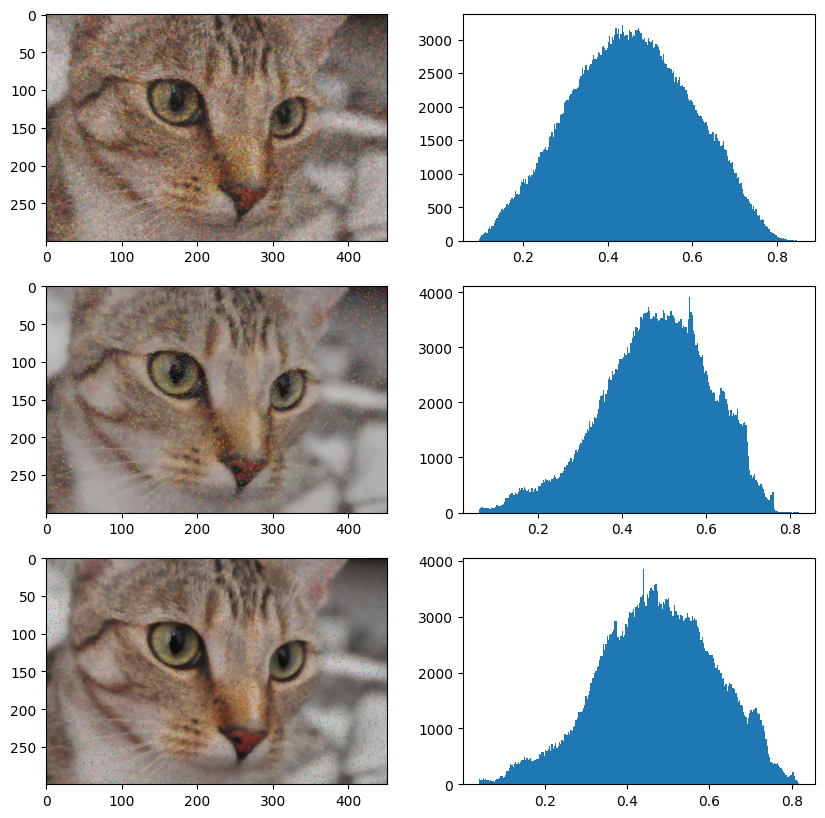

In [54]:
from skimage.restoration import denoise_tv_chambolle

gauss_removed = denoise_tv_chambolle(cat_gaussian_noise, weight =0.1)
salt_removed = denoise_tv_chambolle(cat_salt_noise, weight =0.1)
pepper_removed = denoise_tv_chambolle(cat_pepper_noise, weight =0.1)

plt.figure(figsize=(10,10))
plt.subplot(3,2,1)
plt.imshow(gauss_removed)
plt.subplot(3,2,2)
plt.hist(gauss_removed.ravel(), bins = 256)

plt.subplot(3,2,3)
plt.imshow(salt_removed)
plt.subplot(3,2,4)
plt.hist(salt_removed.ravel(), bins = 256)

plt.subplot(3,2,5)
plt.imshow(pepper_removed)
plt.subplot(3,2,6)
plt.hist(pepper_removed.ravel(), bins = 256)

2. Using denoise_bilateral:

Denoises image using bilateral filter.

Reference: [https://scikit-image.org/docs/stable/api/skimage.restoration.html#skimage.restoration.denoise_bilateral]

(array([  33.,   62.,   93.,  148.,  186.,  191.,  211.,  214.,  259.,
         257.,  289.,  284.,  334.,  327.,  294.,  337.,  330.,  343.,
         392.,  372.,  388.,  411.,  445.,  452.,  418.,  465.,  480.,
         459.,  527.,  533.,  547.,  528.,  600.,  591.,  575.,  631.,
         651.,  640.,  631.,  693.,  719.,  700.,  753.,  776.,  811.,
         800.,  836.,  861.,  894.,  936.,  905.,  959.,  976., 1043.,
        1078., 1104., 1142., 1195., 1223., 1318., 1189., 1331., 1321.,
        1354., 1405., 1333., 1454., 1528., 1645., 1579., 1621., 1650.,
        1605., 1730., 1687., 1676., 1778., 1858., 1774., 1840., 1873.,
        1917., 1933., 1899., 1934., 1993., 1985., 2011., 1922., 2061.,
        2125., 2089., 2115., 2152., 2202., 2265., 2306., 2322., 2304.,
        2365., 2452., 2498., 2477., 2506., 2584., 2535., 2450., 2570.,
        2582., 2706., 2704., 2695., 2729., 2718., 2668., 2751., 2726.,
        2760., 2690., 2836., 2881., 2827., 2794., 2836., 2781., 2739.,
      

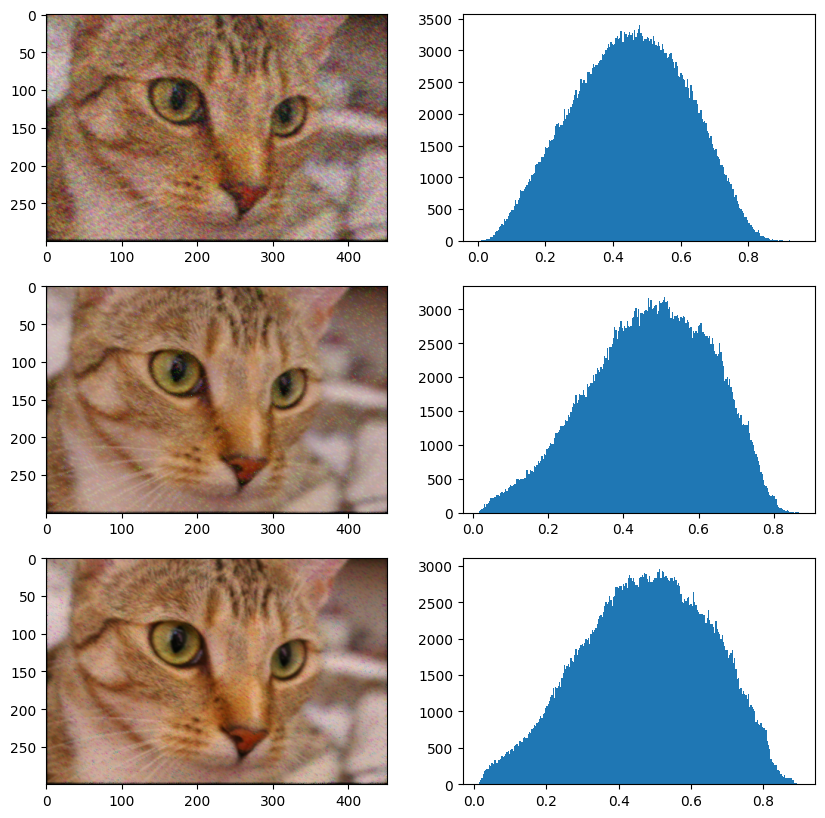

In [55]:
from skimage.restoration import denoise_bilateral

gauss_removed = denoise_bilateral(cat_gaussian_noise, channel_axis =-1)
salt_removed = denoise_bilateral(cat_salt_noise, channel_axis = -1)
pepper_removed = denoise_bilateral(cat_pepper_noise, channel_axis = -1)

plt.figure(figsize=(10,10))
plt.subplot(3,2,1)
plt.imshow(gauss_removed)
plt.subplot(3,2,2)
plt.hist(gauss_removed.ravel(), bins = 256)

plt.subplot(3,2,3)
plt.imshow(salt_removed)
plt.subplot(3,2,4)
plt.hist(salt_removed.ravel(), bins = 256)

plt.subplot(3,2,5)
plt.imshow(pepper_removed)
plt.subplot(3,2,6)
plt.hist(pepper_removed.ravel(), bins = 256)

## Segmentation:

Earlier, we implemented thresholding, which is thes simplest type of segmentation.
Segmentation can be:
* Superised: Example- Thresholding where we specified the threshold
* Unsupervised: Example: Simple Linear Iterative Clustering (SLIC)

Lets try segmentation using SLIC. SLIC segments image using k-means clustering in Color-(x,y,z) space.

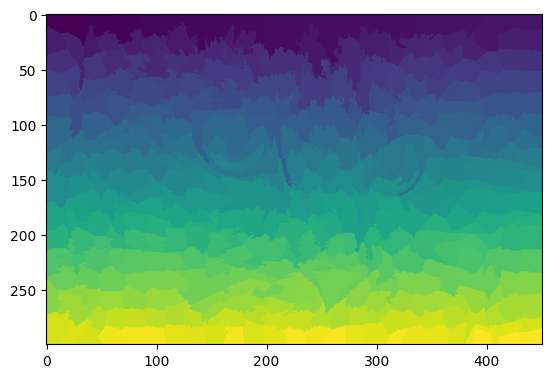

In [56]:
from skimage.segmentation import slic

segments = slic(cat_image, n_segments = 400)         # get segments to put on top of cat_image
plt.imshow(segments)

The above `segments` is the segmented image done via clustering. Now lets import `label2rgb` to lay the segments on top of our rgb image called cat_image.

* segments has the labelled color segments performed via slic segmentation.

* `label2rgb` returns an RGB image where color-coded labels are painted over the image.
  * `kind` parameter =  Kind of color image desired.
    * ‘overlay’ cycles over defined colors and overlays the colored labels over the original image.
    * ‘avg’ replaces each labeled segment with its average color, for a stained-class or pastel painting appearance.

Reference: [https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.label2rgb]

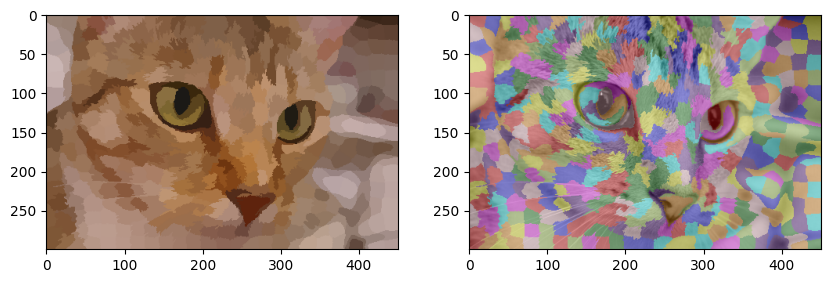

In [57]:
from skimage.color import label2rgb

seg_avg_color = label2rgb(segments, cat_image, kind = 'avg')
seg_overlay_color = label2rgb(segments, cat_image, kind = 'overlay')

plt.figure(figsize = (10,10))
plt.subplot(1,2,1)
plt.imshow(seg_avg_color)
plt.subplot(1,2,2)
plt.imshow(seg_overlay_color)

## Contours:

Contours are formed by closed shape of lines representing boundaries.

They are useful in:

* classifyng shapes
* finding number of objects
* measure the size of objects in an image

The input should be binary image, shich can be obtained by thresholding. So recall that `binary` is the binary image of the image called `camera`.


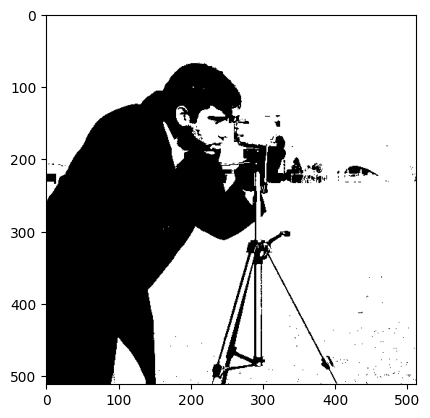

In [58]:
plt.imshow(binary, cmap = 'gray')

In [59]:
from skimage.measure import find_contours

camera_contour = find_contours(binary, 0.8)
print(type(camera_contour))
print(len(camera_contour))

<class 'list'>
252


The `camera_contour` is a list of 252 arrays, so we loop through the list and try plotting the contour in a single plot.

Note that we use plt.plot instead of plt.imshow.

In [60]:
for contour in camera_contour:
  print(contour)

[[5.110e+02 4.028e+02]
 [5.100e+02 4.028e+02]
 [5.092e+02 4.020e+02]
 ...
 [2.572e+02 1.000e+00]
 [2.580e+02 2.000e-01]
 [2.582e+02 0.000e+00]]
[[ 68.2 211. ]
 [ 68.  210.8]
 [ 67.8 211. ]
 [ 68.  211.2]
 [ 68.2 211. ]]
[[101.2 204. ]
 [101.2 203. ]
 [101.  202.8]
 [100.  202.8]
 [ 99.8 203. ]
 [100.  203.2]
 [100.8 204. ]
 [101.  204.2]
 [101.2 204. ]]
[[103.2 218. ]
 [103.  217.8]
 [102.8 218. ]
 [103.  218.2]
 [103.2 218. ]]
[[127.2 267. ]
 [127.  266.8]
 [126.  266.8]
 [125.8 267. ]
 [126.  267.2]
 [127.  267.2]
 [127.2 267. ]]
[[127.2 258. ]
 [127.  257.8]
 [126.8 258. ]
 [127.  258.2]
 [127.2 258. ]]
[[134.2 195. ]
 [134.  194.8]
 [133.  194.8]
 [132.8 195. ]
 [133.  195.2]
 [134.  195.2]
 [134.2 195. ]]
[[142.  320.8]
 [141.8 321. ]
 [141.8 322. ]
 [141.  322.8]
 [140.8 323. ]
 [140.  323.8]
 [139.2 323. ]
 [139.2 322. ]
 [139.2 321. ]
 [139.2 320. ]
 [139.2 319. ]
 [139.2 318. ]
 [140.  317.2]
 [141.  317.2]
 [141.8 318. ]
 [141.8 319. ]
 [142.  319.2]
 [142.8 320. ]
 [142.  32

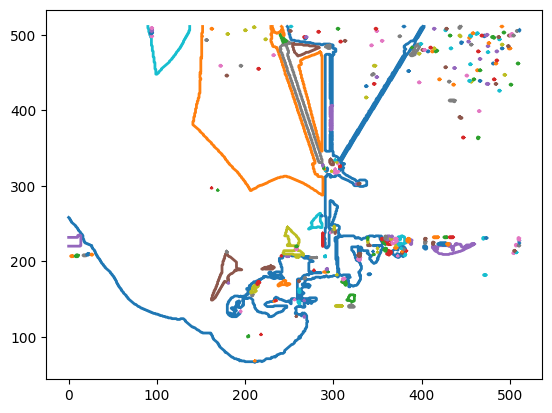

In [61]:
for contour in camera_contour:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)

The image appears inverted because the `plt.imshow` function in matplotlib displays the origin at the top-left corner of the image, while `plt.plot` assumes the origin is at the bottom-left. To correct this, you can invert the y-axis.

We can use `plt.gca` which gets the current axis. Then we can invert the axis.

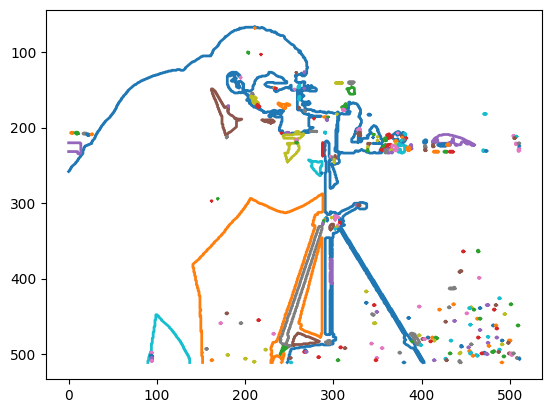

In [62]:
for contour in camera_contour:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)

plt.gca().invert_yaxis()
plt.show()     # if you use this inside the loop, there will be many figures(plots)

## Edge and Corner detection:

Earlier we implemented edge detection from scratch using filters such as sobel filter. Now let's dive into more sophisticated detection techniques including corner detection.


**1. Canny edge detection:**

Unlike sobel, canny edge detection can filter an image using the Canny algorithm, resulting in more sophisticated detection even including loops.

**Agorithm**:

1. Convert the image to grayscale

2. Use a Gaussian filter to smooth the image and reduce the effect of noise.

3. Use the Sobel operator to compute the gradient (magnitude and direction) in both direction.

4. Suppress non-maximum pixels in the gradient magnitude image. Only retaining local maxima in the direction of the gradient, which helps to thin out the edges.

5. Apply a double threshold to determine potential edges.

  * Pixels with a gradient magnitude above the high threshold are considered strong edges.
  * Pixels with a gradient magnitude between the high and low thresholds are considered weak edges.
  * Pixels below the low threshold are suppressed.

6. Perform edge tracking by hysteresis to finalize the detection.

Reference (Algorithm walkthrough): https://en.wikipedia.org/wiki/Canny_edge_detector

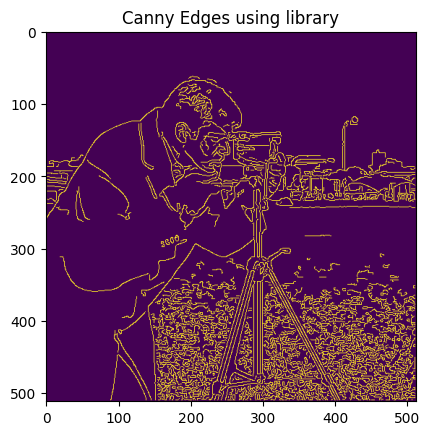

In [63]:
from skimage.feature import canny

edges_library = canny(camera, sigma = 1)   # sigma is standard deviation
plt.title('Canny Edges using library')
plt.imshow(edges_library)

2. Harris Corner detector:

Corner detection is the detection of the junction between contour or 2 edges. Corner detection is used in motion detection , panorama stitching (combining multiple photos with overlapping views), 3D modeling, video tracking, etc.


In skimage, there is a built-in function for this purpose, the arguments are:

`skimage.feature.corner_harris(image, method='k', k=0.05, eps=1e-06, sigma=1)`

Reference: https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_harris


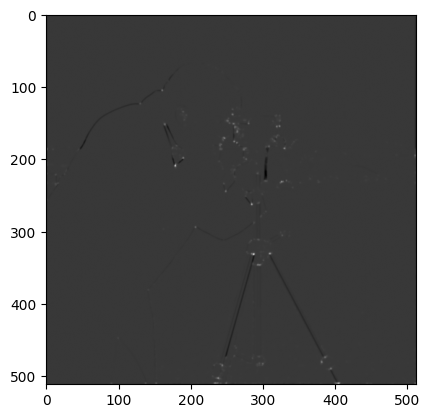

In [64]:
from skimage.feature import corner_harris

corner_detected = corner_harris(camera, k = 0.03, sigma = 1)
plt.imshow(corner_detected, cmap = 'gray')

## Face detection (with cascade classifier):

Face detection is useful for filtering, face blurring (for privacy purpose), recognizing emotions, recommendations,etc.

The skimage.data module provides access to various pre-trained models, example images, and datasets. The function `lbp_frontal_face_cascade_filename() ` specifically gives us the path to the XML file containing the pre-trained LBP cascade for face detection. We can use this file path to load the LBP cascade into a face detection algorithm (e.g., in OpenCV) to detect faces in images.


In [65]:
friends = cv2.imread('/content/friends.png')
friends = cv2.cvtColor(friends, cv2.COLOR_BGR2RGB)     # BGR ----> RGB

In [66]:
from skimage.feature import Cascade

trained_file = data.lbp_frontal_face_cascade_filename()

detector = Cascade(trained_file)

detected_friends = detector.detect_multi_scale(img=friends, scale_factor=1.1, step_ratio=1, min_size=(50, 50), max_size=(150, 150))

In [67]:
print(type(detected_friends))
print(detected_friends)

<class 'list'>
[{'r': 105, 'c': 438, 'width': 104, 'height': 104}, {'r': 726, 'c': 234, 'width': 77, 'height': 77}, {'r': 159, 'c': 562, 'width': 97, 'height': 97}, {'r': 339, 'c': 639, 'width': 97, 'height': 97}, {'r': 335, 'c': 192, 'width': 98, 'height': 98}, {'r': 216, 'c': 319, 'width': 115, 'height': 115}, {'r': 302, 'c': 700, 'width': 122, 'height': 122}]


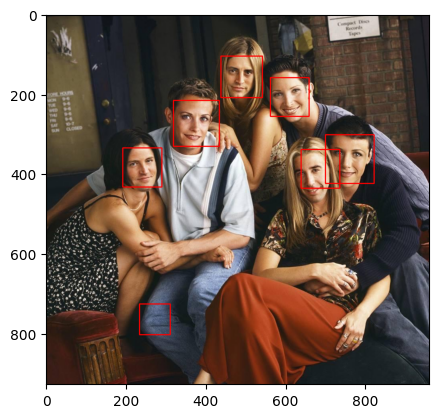

In [68]:
# Draw rectangles on the image
for patch in detected_friends:
    cv2.rectangle(friends, (patch['c'], patch['r']), (patch['c'] + patch['width'], patch['r'] + patch['height']), color=(255, 0, 0), thickness=2)

plt.imshow(friends)

The detected faces are not as accurate as we want them to be. We should take into account that false detections are inevitable and if you want to have a really precise detector, you will have to train it yourself using OpenCV train cascade utility.

Reference: https://scikit-image.org/docs/stable/auto_examples/applications/plot_face_detection.html

For Cascade training: https://docs.opencv.org/2.4/doc/user_guide/ug_traincascade.html


Lets try on another simpler image instead.

In [69]:
trained_file = data.lbp_frontal_face_cascade_filename()

detector = Cascade(trained_file)

astronaut = data.astronaut()

detected = detector.detect_multi_scale(img=astronaut, scale_factor=1.2, step_ratio=1, min_size=(60, 60), max_size=(123, 123))

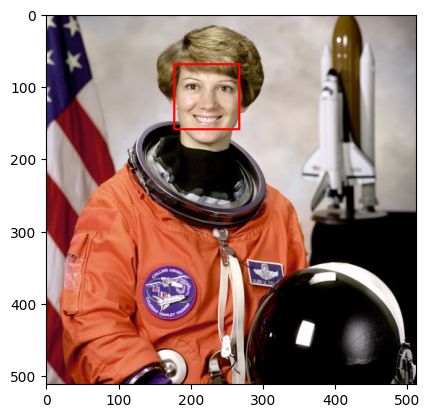

In [70]:
# Draw rectangles on the image
for patch in detected:
    cv2.rectangle(astronaut, (patch['c'], patch['r']), (patch['c'] + patch['width'], patch['r'] + patch['height']), color=(255, 0, 0), thickness=2)

plt.imshow(astronaut)

### Recap:

This is the end of this notebook. You learned the following:

1. Nature of image, its types and histogram
2. Thresholding and Filtering
3. Smoothing and Noise in images
4. Transformation of images (rescale,resize,etc..)
5. Contrast and Morphology (dilation,erosion) in images
6. Restoration of images
7. Segmentation
8. Edge detection (Sobel, laplace, canny) and Corner detection (Harris corner)
9. Face detection